## **Introduction**

&#8226;&nbsp;**AutoViz** là một thư viên **Python** giúp ta tự động tạo nhiều biểu đồ (*histogram, scatter, box, violin,* ...) từ một dataset chỉ với vài dòng lệnh.<br>
&#8226;&nbsp;Mục tiêu của thư viện là hỗ trợ khám phá dữ liệu (**Exploratory Data Analysis**) nhanh chóng, đặc biệt là khi chúng ta không muốn viết quá nhiều mã để vẽ các biểu đồ một cách thủ công.<br>
&#8226;&nbsp;**AutoViz** còn có tính năng hỗ trợ nhận xét chất lượng dữ liệu, phát hiện các missing value, outlier và gợi ý cách xử lí (drop, cap, impute, encode, ...).

## **Cài đặt thư viện AutoViz**

In [ ]:
!pip install autoviz

## **Import các thư viện cần thiết**

In [ ]:
import pandas as pd
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

## **Load dataset**<br>
Đọc tài liệu từ file CSV vào DataFrame

In [ ]:
df = pd.read_csv("marketing_campaign.csv", sep="\t")
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


## **Khởi tạo class AutoViz**<br>
&#8226;&nbsp;Tạo 1 đối tượng AutoViz (gọi tắt là AV) để dùng các hàm của thư viện.<br>

In [ ]:
AV = AutoViz_Class()

## **Gọi hàm AutoViz**<br>
Các đối số cơ bản của phương thức AutoViz():<br>
&#8226;&nbsp; ***`filename`*** : Sử dụng một chuỗi rỗng ("") nếu không có tên tệp dữ liệu nào được liên kết và bạn muốn sử dụng một khung dữ liệu. Trong trường hợp đó, hãy sử dụng đối số ***`dfte`*** cho khung dữ liệu. Nếu không, hãy cung cấp tên tệp và để lại đối số ***`dfte`*** với một chuỗi rỗng. Chỉ có thể sử dụng một trong hai.<br>
&#8226;&nbsp; ***`sep`***: Dấu phân cách tệp (dấu phẩy, dấu chấm phẩy, dấu tab hoặc bất kỳ giá trị phân tách cột nào) nếu bạn sử dụng tên tệp ở trên.<br>
&#8226;&nbsp; ***`depVar`***: Biến mục tiêu trong tập dữ liệu của bạn; đặt thành chuỗi trống nếu không áp dụng được.<br>
&#8226;&nbsp; ***`dfte`***: tên của khung dữ liệu pandas để vẽ biểu đồ; để nó dưới dạng chuỗi trống nếu sử dụng tên tệp.<br>
&#8226;&nbsp; ***`header`***: đặt số hàng của hàng tiêu đề trong tệp của bạn (0 cho hàng đầu tiên). Nếu không, hãy giữ nguyên là 0.<br>
&#8226;&nbsp; ***`verbose`***: 0 để biết thông tin tối thiểu và biểu đồ, 1 để biết thêm thông tin và biểu đồ hoặc 2 để lưu biểu đồ cục bộ mà không hiển thị.<br>
&#8226;&nbsp; ***`lowess`***: Sử dụng đường hồi quy cho từng cặp biến liên tục so với biến mục tiêu trong các tập dữ liệu nhỏ; tránh sử dụng cho các tập dữ liệu lớn (>100.000 hàng).<br>
&#8226;&nbsp; ***`chart_format`***: 'svg', 'png', 'jpg', 'bokeh', 'server' hoặc 'html' để hiển thị hoặc lưu biểu đồ ở nhiều định dạng khác nhau, tùy thuộc vào tùy chọn chi tiết.<br>
&#8226;&nbsp; ***`max_rows_analyzed`***: Giới hạn số lượng hàng tối đa được sử dụng để trực quan hóa khi xử lý các tập dữ liệu rất lớn (hàng triệu hàng). **Autoviz** sẽ sử dụng một mẫu có giá trị thống kê. Mặc định là 150000 hàng.<br>
&#8226;&nbsp; ***`max_cols_analyzed`***: Giới hạn số lượng biến liên tục cần phân tích. Mặc định là 30 cột.<br>
&#8226;&nbsp; ***`save_plot_dir`***: Thư mục lưu đồ thị. Mặc định là None, thư mục này sẽ lưu đồ thị trong thư mục hiện tại vào một thư mục con có tên ***AutoViz_Plots***. Nếu ***`save_plot_dir`*** không tồn tại, nó sẽ được tạo.


## **Sau khi thực hiện đoạn mã, AutoViz sẽ hiện ra những nội dung sau:**<br>
### ***1. Tóm tắt dữ liệu  và phân lớp các biến.***<br>
&#8226;&nbsp;&nbsp; In ra số dòng, cột của tập dữ liệu.<br>
&#8226;&nbsp;&nbsp; Phân loại các cột thành: numeric, integer, string, boolean, datetime, ID, ...<br>
&#8226;&nbsp;&nbsp; Liệt kê các biến nên loại bỏ (low-infomation hoặc ID).<br>
### ***2. Bảng báo cáo chất lượng dữ liệu.***<br>
AutoViz hiển thị chi tiết thông tin từng cột:<br>
&#8226;&nbsp;&nbsp; Kiểu dữ liệu (object, int, float, ...).<br>
&#8226;&nbsp;&nbsp; Phần trăm giá trị bị thiếu (Missing Value%).<br>
&#8226;&nbsp;&nbsp; Hiển thị số lượng giá trị là duy nhất (Unique Value%).<br>
&#8226;&nbsp;&nbsp; Giá trị lớn nhất, nhỏ nhất của từng cột (Minimun Value, Maximun Value).<br>
&#8226;&nbsp;&nbsp; Đưa ra cảnh báo về những dữ liệu bất thường (outliers, high cardinality, rare categories,...).<br>
### ***3. Các biểu đồ EDA được vẽ tự động***<br>
AutoViz sẽ tự động vẽ các biểu đồ tương ứng với giá trị của đối số `chart_format`:<br>
&#8226;&nbsp;&nbsp; `svg`(mặc định): vẽ toàn bộ biểu đồ bằng Matplotlib, lưu ở định dạng **SVG** , một số khác cũng thuộc loại ảnh vector như : `svgz`, `eps`, `pdf`, `ps`, `pgf`.<br>
&#8226;&nbsp;&nbsp; `png` : tương tự như `svg` nhưng lưu dưới định dạng **PNG**, một số cùng thuộc loại ảnh Raster như : `jpg`, `jpeg`, `webp`, `raw`, `rgba`, ...<br>
&#8226;&nbsp;&nbsp; `hist` : chỉ vẽ các biểu đồ ***Histogram***, điều kiện là `depVar` = "" (phân phối dữ liệu).<br>
&#8226;&nbsp;&nbsp; Các loại biểu đồ khác như ***Scatter Plot***, ***Box Plot***, ***Bar Chart*** có tác dụng giúp ta xác định các quan hệ tuyến tính, phát hiện outliers, phân phối theo tứ phân vị,...<br>
&#8226;&nbsp;&nbsp; Và 1 số loại biểu đồ tương tác như: `bokeh` (có thể zoom, hover tooltip, filter), `html` (xuất biểu đồ thành 1 file HTML có thể mở bằng trình duyệt) hoặc `server` (chạy bằng dashboard, mở trực tiếp trong trình duyệt).

Shape of your Data Set loaded: (2240, 29)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  15
    Number of String-Categorical Columns =  2
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  7
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  2
    28 Predictors classified...
        3 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['ID', 'Z_CostContact', 'Z_Revenue']

################ Regression p

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Year_Birth,int64,0.000000,2,1893.000000,1996.000000,Column has 3 outliers greater than upper bound (2004.00) or lower than lower bound(1932.00). Cap them or remove them.
Education,object,0.000000,0,,,No issue
Marital_Status,object,0.000000,0,,,"3 rare categories: ['Alone', 'Absurd', 'YOLO']. Group them into a single category or drop the categories."
Kidhome,int64,0.000000,0,0.000000,2.000000,No issue
Teenhome,int64,0.000000,0,0.000000,2.000000,No issue
Dt_Customer,object,0.000000,32,,,Possible high cardinality column with 663 unique values: Use hash encoding or text embedding to reduce dimension.
Recency,int64,0.000000,4,0.000000,99.000000,No issue
MntWines,int64,0.000000,37,0.000000,1493.000000,Column has 33 outliers greater than upper bound (1225.50) or lower than lower bound(-698.50). Cap them or remove them.
MntFruits,int64,0.000000,7,0.000000,199.000000,Column has 207 outliers greater than upper bound (81.00) or lower than lower bound(-47.00). Cap them or remove them.
MntMeatProducts,int64,0.000000,27,0.000000,1725.000000,Column has 174 outliers greater than upper bound (549.75) or lower than lower bound(-304.25). Cap them or remove them.


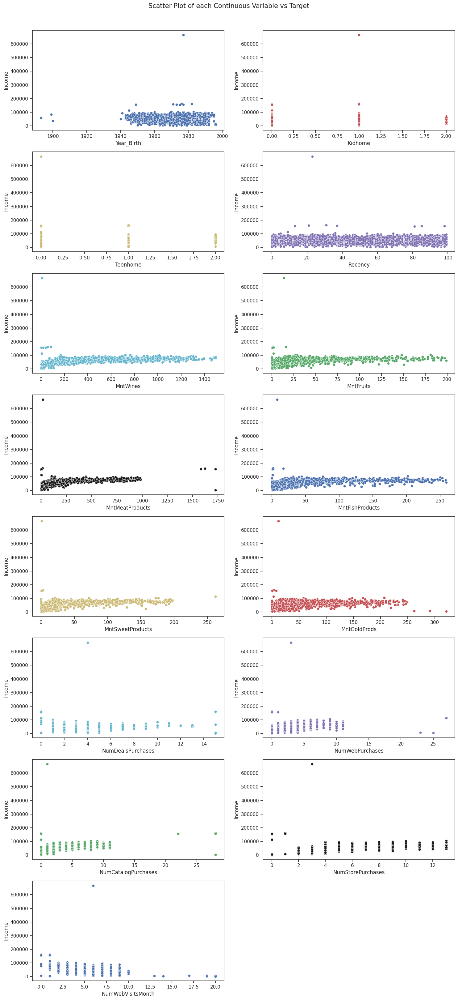

Number of All Scatter Plots = 120


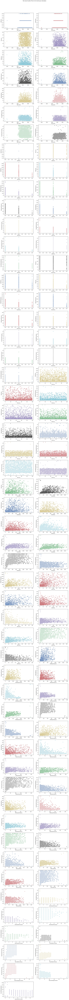

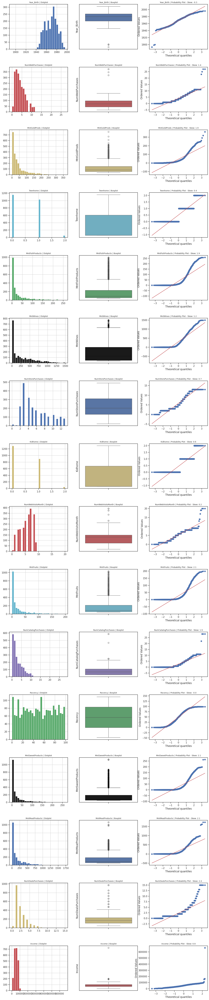

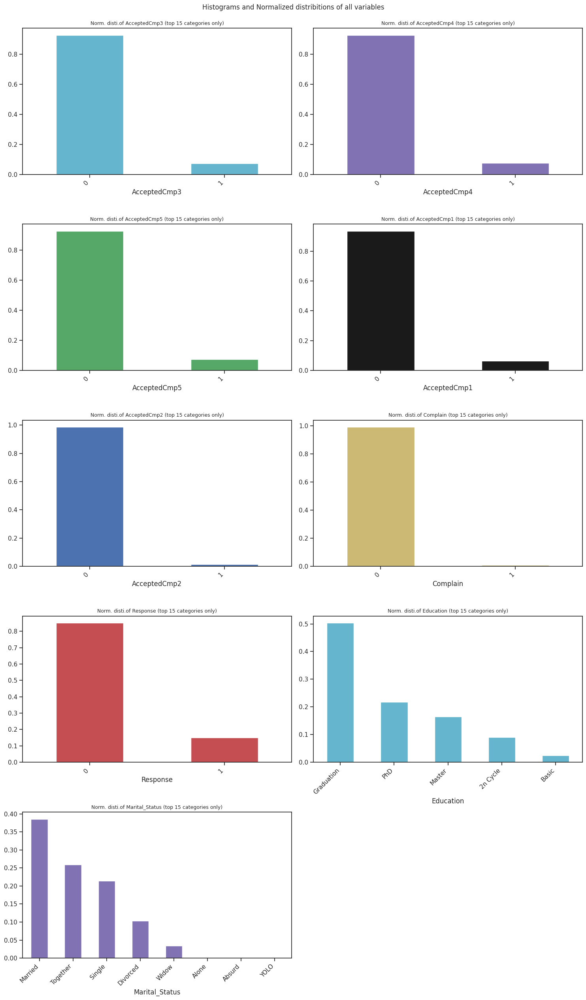

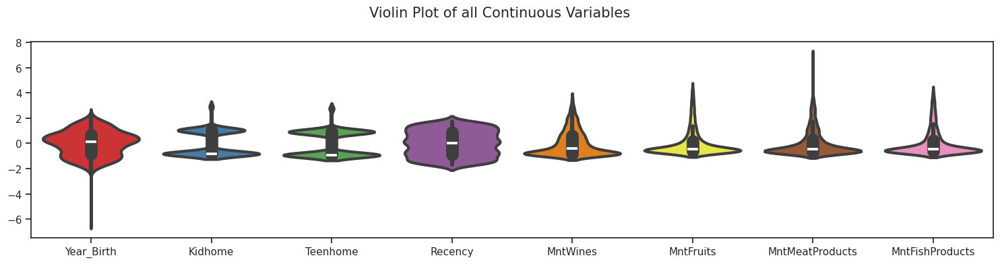

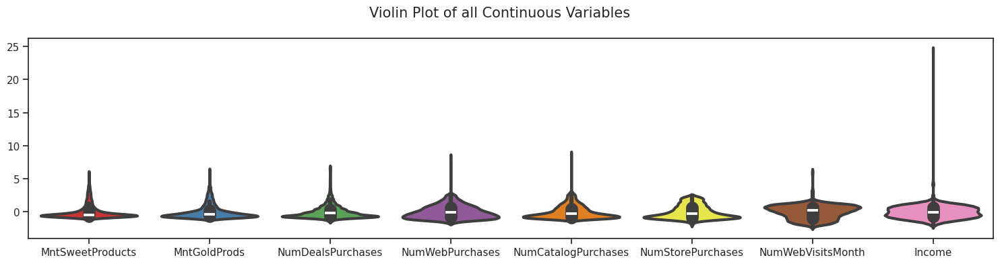

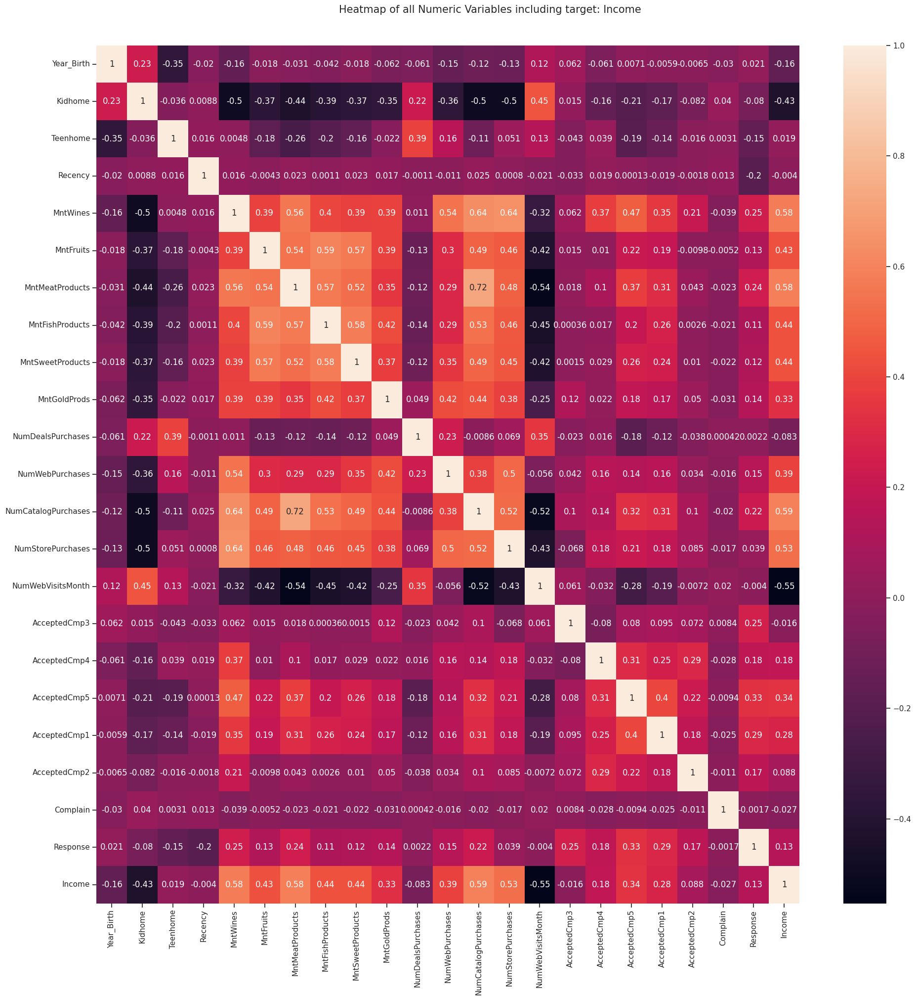

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

Could not draw wordcloud plot for Dt_Customer. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

All Plots done
Time to run AutoViz = 72 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


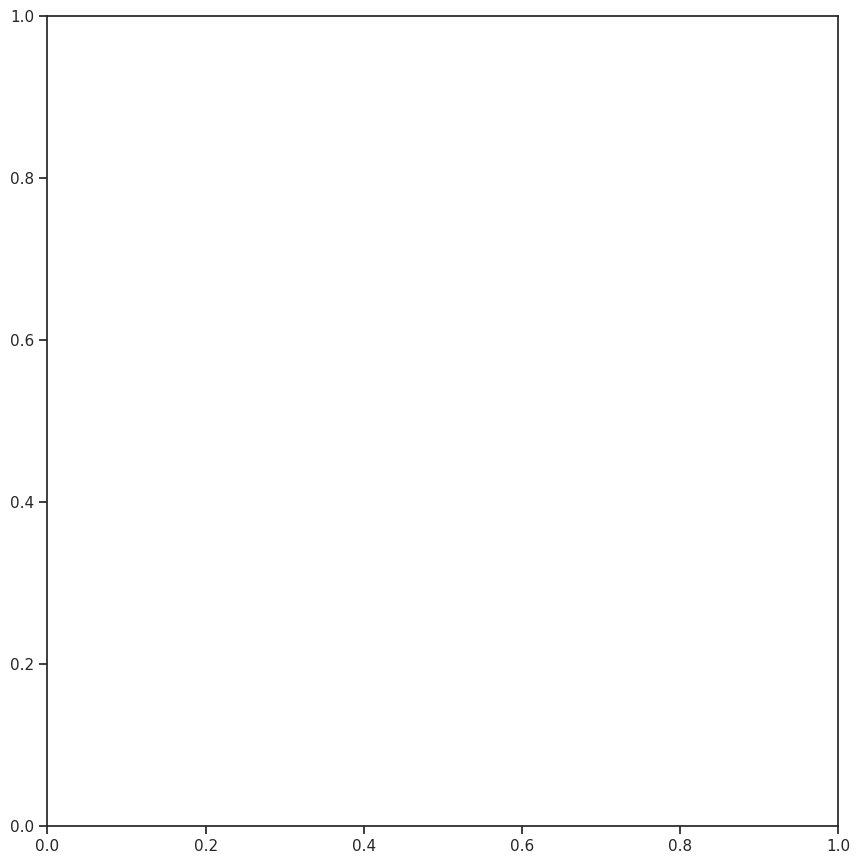

In [ ]:
dft = AV.AutoViz(
    "",
    dfte=df,
    depVar="Income",
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    verbose=1
)

## **Một số phương thức ngắn ngọn hơn để tiện cho 1 số công việc đơn giản.**


### ***Class FixDQ - chuyên xử lý Data Quality(DQ)***
Cách sử dụng hàm:<br>
&#8226;&nbsp;&nbsp; Tạo 1 đối tượng ***FixDQ***.<br>
&#8226;&nbsp;&nbsp; Đưa DataFrame gốc vào bằng lệnh `fit_transform()`, lúc này ***FixDQ*** sẽ quét toàn bộ dữ liệu , tìm lỗi và sửa chữa.<br>
Ý nghĩa:<br>
&#8226;&nbsp;&nbsp;Tự động tự động làm sạch dữ liệu trước khi đưa vào EDA hoặc mô hình.<br>
&#8226;&nbsp;&nbsp;Tránh lỗi khi AutoViz vẽ (ví dụ cột toàn NaN, kiểu dữ liệu bị sai).


In [ ]:
from autoviz import FixDQ
fixdq = FixDQ()
df_fixed = fixdq.fit_transform(df)


    Dropping 1 ID column(s): ['ID']
    Dropping 2 zero-variance cols: ['Z_CostContact', 'Z_Revenue']
Dropped 3 columns total in dataset


### ***Function data_cleaning_suggestions - Hàm tiện ích trong AutoViz***
Cách sử dụng:<br>
&#8226;&nbsp;&nbsp;Import hàm `data_cleaning_suggestions` từ ***AutoViz***.<br>
&#8226;&nbsp;&nbsp;Truyền *DataFrame* (df) của bạn vào.<br>
Hàm này không thay đổi mà in ra báo cáo gợi ý  làm sạch dựa trên DataFrame:<br>
&#8226;&nbsp;&nbsp; Các vị trí **Missing Value** được gợi ý điền `mean`, `median`, `mode` hoặc xóa cột/hàng.<br>
&#8226;&nbsp;&nbsp; Các cột hằng số, ít thông tin được khuyên nên loại bỏ.<br>
&#8226;&nbsp;&nbsp; Nhận diện các giá trị bất thường trong dữ liệu số.<br>
&#8226;&nbsp;&nbsp; Các kiểu dữ liệu không chuẩn như cột số nhưng lại có giá trị object, gợi ý convert sang **int/float**.<br>
&#8226;&nbsp;&nbsp; Biến phân loại nếu có số lượng **unique** quá lớn, đưa ra cảnh báo **high cardinality**.<br>
&#8226;&nbsp;&nbsp; Kiểm tra ***imbalance*** của cột `target`(nếu có) có mất cân bằng không.

In [ ]:
from autoviz import data_cleaning_suggestions

data_cleaning_suggestions(df)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
ID,int64,0.000000,100,0.000000,11191.000000,Possible ID column: drop before modeling step.
Year_Birth,int64,0.000000,2,1893.000000,1996.000000,Column has 3 outliers greater than upper bound (2004.00) or lower than lower bound(1932.00). Cap them or remove them.
Education,object,0.000000,0,,,No issue
Marital_Status,object,0.000000,0,,,"3 rare categories: ['Alone', 'Absurd', 'YOLO']. Group them into a single category or drop the categories."
Income,float64,1.071429,NA,1730.000000,666666.000000,"24 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 8 outliers greater than upper bound (118350.50) or lower than lower bound(-14525.50). Cap them or remove them."
Kidhome,int64,0.000000,0,0.000000,2.000000,No issue
Teenhome,int64,0.000000,0,0.000000,2.000000,No issue
Dt_Customer,object,0.000000,29,,,Possible high cardinality column with 663 unique values: Use hash encoding or text embedding to reduce dimension.
Recency,int64,0.000000,4,0.000000,99.000000,No issue
MntWines,int64,0.000000,34,0.000000,1493.000000,Column has 35 outliers greater than upper bound (1225.00) or lower than lower bound(-697.00). Cap them or remove them.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
ID,int64,0.000000,100,0.0,11191.0,Possible ID column: drop before modeling step.
Year_Birth,int64,0.000000,2,1893.0,1996.0,Column has 3 outliers greater than upper bound (2004.00) or lower than lower bound(1932.00). Cap them or remove them.
Education,object,0.000000,0,,,No issue
Marital_Status,object,0.000000,0,,,"3 rare categories: ['Alone', 'Absurd', 'YOLO']. Group them into a single category or drop the categories."
Income,float64,1.071429,NA,1730.0,666666.0,"24 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 8 outliers greater than upper bound (118350.50) or lower than lower bound(-14525.50). Cap them or remove them."
Kidhome,int64,0.000000,0,0.0,2.0,No issue
Teenhome,int64,0.000000,0,0.0,2.0,No issue
Dt_Customer,object,0.000000,29,,,Possible high cardinality column with 663 unique values: Use hash encoding or text embedding to reduce dimension.
Recency,int64,0.000000,4,0.0,99.0,No issue
MntWines,int64,0.000000,34,0.0,1493.0,Column has 35 outliers greater than upper bound (1225.00) or lower than lower bound(-697.00). Cap them or remove them.
